# Section 19: Understand and design CNNs

In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
import sklearn.metrics as skm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
import torchvision
import torchvision.transforms as T
from torchsummary import summary

import copy

## CNN to classify MNIST digits

In [2]:
data = np.loadtxt(open('mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:, 0]
data = data[:, 1:]
data_norm = data / np.max(data)
data_norm = data_norm.reshape(data_norm.shape[0], 1, 28, 28)

print(data_norm.shape)
print(labels.shape)

(20000, 1, 28, 28)
(20000,)


In [3]:
data_t = torch.tensor(data_norm).float()
labels_t = torch.tensor(labels).long()

train_data, test_data, train_labels, test_labels = train_test_split(data_t, labels_t, test_size=.1)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=test_dataset.tensors[0].shape[0])

In [4]:
train_loader.dataset.tensors[0].shape

torch.Size([18000, 1, 28, 28])

In [5]:
def create_model(print_toggle_param=False):
    class MnistNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, 10, 5, 1, 1)
            self.conv2 = nn.Conv2d(10, 20, 5, 1, 1)
            
            expected_size = np.floor((5 + 2 * 0 - 1) / 1) + 1
            expected_size = 20 * int(expected_size ** 2)
            
            self.fc1 = nn.Linear(expected_size, 50)
            self.output = nn.Linear(50, 10)
            
        def forward(self, x_param):
            if print_toggle_param: print(f"Input: {x_param.shape}")
            
            x_local = F.relu(F.max_pool2d(self.conv1(x_param), 2))
            
            if print_toggle_param: print(f"Layer conv1/pool1: {x_local.shape}")
            
            x_local = F.relu(F.max_pool2d(self.conv2(x_local), 2))
            
            if print_toggle_param: print(f"Layer conv2/pool2: {x_local.shape}")
            
            x_local = torch.flatten(x_local, start_dim=1)
            
            if print_toggle_param: print(f"Vectorized: {x_local.shape}")
            
            x_local = F.relu(self.fc1(x_local))
            
            if print_toggle_param: print(f"Layer fc1: {x_local.shape}")
            
            x_local = self.output(x_local)
            
            if print_toggle_param: print(f"Layer out: {x_local.shape}")
            
            return x_local
        
    mnist_net_local = MnistNet()
    loss_function_local = nn.CrossEntropyLoss()
    optimizer_local = torch.optim.Adam(mnist_net_local.parameters(), lr=.001)
    
    return mnist_net_local, loss_function_local, optimizer_local

In [6]:
mnist_net, loss_function, _ = create_model(True)

X, y = next(iter(train_loader))
y_pred = mnist_net(X)

print()
print(f"Output shape: {y_pred.shape}")

loss = loss_function(y_pred, y)

print()
print(f"Loss: {loss}")

Input: torch.Size([32, 1, 28, 28])
Layer conv1/pool1: torch.Size([32, 10, 13, 13])
Layer conv2/pool2: torch.Size([32, 20, 5, 5])
Vectorized: torch.Size([32, 500])
Layer fc1: torch.Size([32, 50])
Layer out: torch.Size([32, 10])

Output shape: torch.Size([32, 10])

Loss: 2.2955994606018066


In [7]:
summary(mnist_net, (1, 28, 28))

Input: torch.Size([2, 1, 28, 28])
Layer conv1/pool1: torch.Size([2, 10, 13, 13])
Layer conv2/pool2: torch.Size([2, 20, 5, 5])
Vectorized: torch.Size([2, 500])
Layer fc1: torch.Size([2, 50])
Layer out: torch.Size([2, 10])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 26, 26]             260
            Conv2d-2           [-1, 20, 11, 11]           5,020
            Linear-3                   [-1, 50]          25,050
            Linear-4                   [-1, 10]             510
Total params: 30,840
Trainable params: 30,840
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.07
Params size (MB): 0.12
Estimated Total Size (MB): 0.19
----------------------------------------------------------------


In [8]:
def train_model(mnist_net_local, loss_function_local, optimizer_local):
    losses_local = []
    train_accuracies_local = []
    test_accuracies_local = []
     
    for epoch in range(10):
        batch_losses = []
        batch_accuracies = []
         
        mnist_net_local.train()
         
        for X_local, y_local in train_loader:
            y_pred_local = mnist_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
               
            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()
            
            batch_losses.append(loss_local.item())
               
            correct_predictions = (torch.argmax(y_pred_local, axis=1) == y_local).float()
             
            batch_accuracies.append(100 * torch.mean(correct_predictions).item())

        train_accuracies_local.append(np.mean(batch_accuracies))
        losses_local.append(np.mean(batch_losses))
        mnist_net_local.eval()
          
        X_local, y_local = next(iter(test_loader))
          
        with torch.no_grad():
            y_pred_local = mnist_net_local(X_local)
          
        correct_predictions = (torch.argmax(y_pred_local, axis=1) == y_local).float()
          
        test_accuracies_local.append(100 * torch.mean(correct_predictions).item())
     
    return train_accuracies_local, test_accuracies_local, losses_local, mnist_net

In [9]:
mnist_net, loss_function, optimizer = create_model()
train_accuracies, test_accuracies, losses, _ = train_model(mnist_net, loss_function, optimizer)

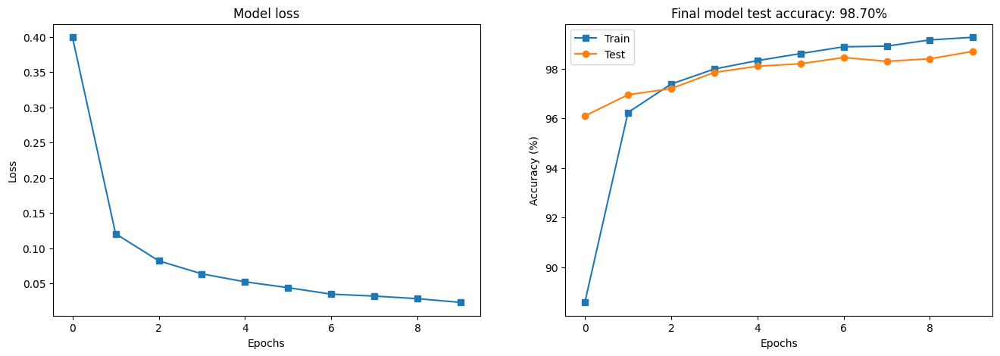

In [10]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(losses, 's-')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")

ax[1].plot(train_accuracies, 's-', label='Train')
ax[1].plot(test_accuracies, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Accuracy (%)")
ax[1].set_title(f"Final model test accuracy: {test_accuracies[-1]:.2f}%")
ax[1].legend()

plt.show()

## CNN on shifted MNIST

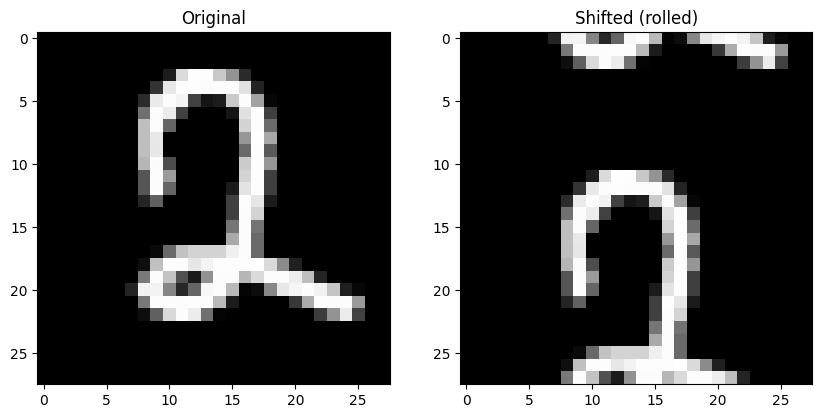

In [11]:
image = test_loader.dataset.tensors[0][0, :]
image_shifted = torch.roll(image, 8, dims=1)

_, ax = plt.subplots(1, 2, figsize=(10, 6))

ax[0].imshow(torch.squeeze(image), cmap='gray')
ax[0].set_title('Original')

ax[1].imshow(torch.squeeze(image_shifted), cmap='gray')
ax[1].set_title("Shifted (rolled)")

plt.show()

In [12]:
for i in range(train_loader.dataset.tensors[0].shape[0]):
    image = train_loader.dataset.tensors[0][i, :, :]
    random_roll = np.random.randint(-10, 11)
    image = torch.roll(image, random_roll, dims=1)
    train_loader.dataset.tensors[0][i, :, :] = image

In [13]:
for i in range(test_loader.dataset.tensors[0].shape[0]):
    image = test_loader.dataset.tensors[0][i, :, :]
    random_roll = np.random.randint(-10, 11)
    image = torch.roll(image, random_roll, dims=1)
    test_loader.dataset.tensors[0][i, :, :] = image

In [14]:
mnist_net, loss_function, optimizer = create_model(False)
train_accuracies, test_accuracies, losses, _ = train_model(mnist_net, loss_function, optimizer)

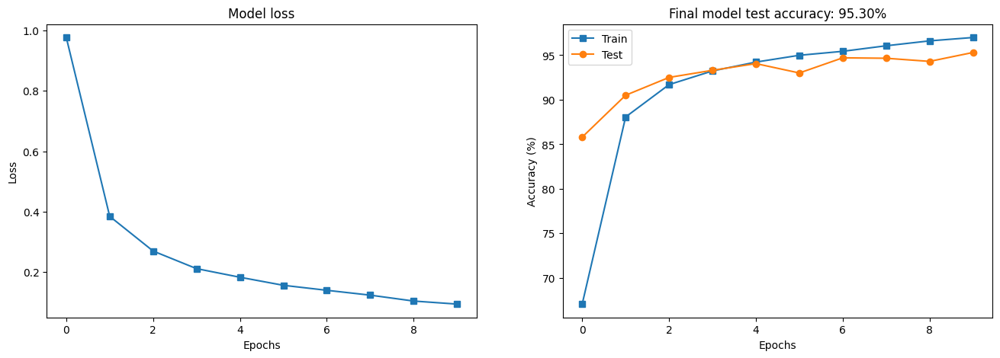

In [15]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(losses, 's-')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")

ax[1].plot(train_accuracies, 's-', label='Train')
ax[1].plot(test_accuracies, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Accuracy (%)")
ax[1].set_title(f"Final model test accuracy: {test_accuracies[-1]:.2f}%")
ax[1].legend()

plt.show()

## Classify Gaussian blurs

In [16]:
samples_per_class = 1000
image_size = 91
x = np.linspace(-4, 4, image_size)
X, Y = np.meshgrid(x, x)
widths = [1.8, 2.4]

images = torch.zeros(2 * samples_per_class, 1, image_size, image_size)
labels = torch.zeros(2 * samples_per_class)

for i in range(2 * samples_per_class):
    random_offset = 2 * np.random.randn(2)
    gaussian = np.exp(-((X - random_offset[0]) ** 2 + (Y - random_offset[1]) ** 2) / ( 2 * widths[i % 2] ** 2))
    gaussian = gaussian + np.random.randn(image_size, image_size) / 5
    
    images[i, :, :, :] = torch.Tensor(gaussian).view(1, image_size, image_size)
    labels[i] = i % 2
    
labels = labels[:, None]

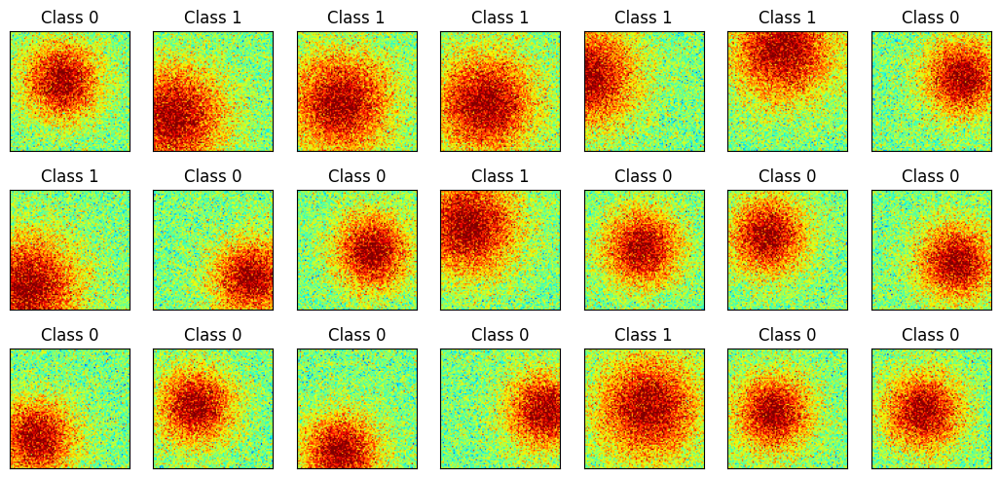

In [17]:
_, ax = plt.subplots(3, 7, figsize=(13, 6))

for i, ax in enumerate(ax.flatten()):
    index = np.random.randint(2 * samples_per_class)
    gaussian = np.squeeze(images[index, :, :])
    
    ax.imshow(gaussian, vmin=-1, vmax=1, cmap='jet')
    ax.set_title("Class %s" %int(labels[index].item()))
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.show()

In [18]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_dataset.tensors[0].shape[0])

In [19]:
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)

torch.Size([1800, 1, 91, 91])
torch.Size([1800, 1])


In [20]:
def create_model():
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.enc = nn.Sequential(
                nn.Conv2d(1, 6, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
                nn.Conv2d(6, 4, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
                nn.Flatten(),
                nn.Linear(22 * 22 * 4, 50),
                nn.Linear(50, 1)
            )
            
        def forward(self, x_param):
            return self.enc(x_param)
        
    gaussian_net_local = GaussianNet()
    loss_function_local = nn.BCEWithLogitsLoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)
    
    return gaussian_net_local, loss_function_local, optimizer_local

In [21]:
gaussian_net, loss_function, _ = create_model()

X, y = next(iter(train_loader))
y_pred = gaussian_net(X)

print(f"Output shape: {y_pred.shape}")

loss = loss_function(y_pred, y)

print()
print(f"Loss: {loss}")

Output shape: torch.Size([32, 1])

Loss: 0.6951430439949036


In [22]:
summary(gaussian_net, (1, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
           Flatten-7                 [-1, 1936]               0
            Linear-8                   [-1, 50]          96,850
            Linear-9                    [-1, 1]              51
Total params: 97,181
Trainable params: 97,181
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.00
Params size (MB): 0.37
Estimated Total Size (MB): 1.41
---------------------------------------------

In [23]:
def train_model(gaussian_net_local, loss_function_local, optimizer_local):
    train_losses_local = []
    test_losses_local = []
    train_accuracies_local = []
    test_accuracies_local = []
     
    for epoch in range(10):
        batch_losses = []
        batch_accuracies = []
         
        gaussian_net_local.train()
         
        for X_local, y_local in train_loader:
            y_pred_local = gaussian_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
               
            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()
            
            batch_losses.append(loss_local.item())
            batch_accuracies.append(torch.mean(((y_pred_local > 0) == y_local).float()).item())

        train_losses_local.append(np.mean(batch_losses))
        train_accuracies_local.append(100 * np.mean(batch_accuracies))

        gaussian_net_local.eval()
          
        X_local, y_local = next(iter(test_loader))
          
        with torch.no_grad():
            y_pred_local = gaussian_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
          
        test_losses_local.append(loss_local.item())
        test_accuracies_local.append(100 * torch.mean(((y_pred_local > 0) == y_local).float()).item())
     
    return train_accuracies_local, test_accuracies_local, train_losses_local, test_losses_local, gaussian_net_local

In [24]:
gaussian_net, loss_function, optimizer = create_model()
train_accuracies, test_accuracies, train_losses, test_losses, _ = train_model(gaussian_net, loss_function, optimizer)

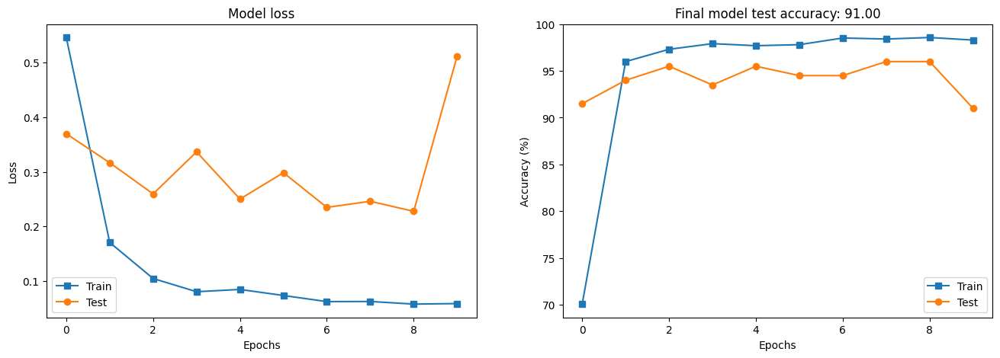

In [25]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(train_losses, 's-', label='Train')
ax[0].plot(test_losses, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")
ax[0].legend()

ax[1].plot(train_accuracies, 's-', label='Train')
ax[1].plot(test_accuracies, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Accuracy (%)")
ax[1].set_title(f"Final model test accuracy: {test_accuracies[-1]:.2f}")
ax[1].legend()

plt.show()

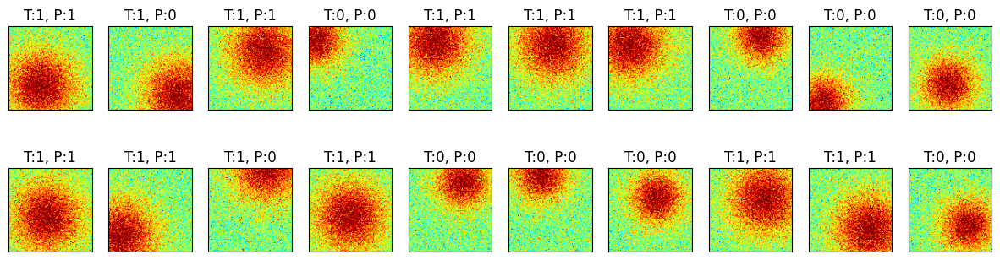

In [26]:
X, y = next(iter(test_loader))
y_pred = gaussian_net(X)

_, ax = plt.subplots(2, 10, figsize=(15, 4))

for i, ax in enumerate(ax.flatten()):
    image = torch.squeeze(X[i, 0, :, :]).detach()
    
    ax.imshow(image, vmin=-1, vmax=1, cmap='jet')
    ax.set_title("T:%s, P:%s" %(int(y[i].item()), int(y_pred[i].item() > 0)))
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.show()

In [27]:
print(gaussian_net)

layer_1_weights = gaussian_net.enc[0].weight
layer_3_weights = gaussian_net.enc[3].weight

print()
print(layer_1_weights.shape)
print(layer_3_weights.shape)

GaussianNet(
  (enc): Sequential(
    (0): Conv2d(1, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(6, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=1936, out_features=50, bias=True)
    (8): Linear(in_features=50, out_features=1, bias=True)
  )
)

torch.Size([6, 1, 3, 3])
torch.Size([4, 6, 3, 3])


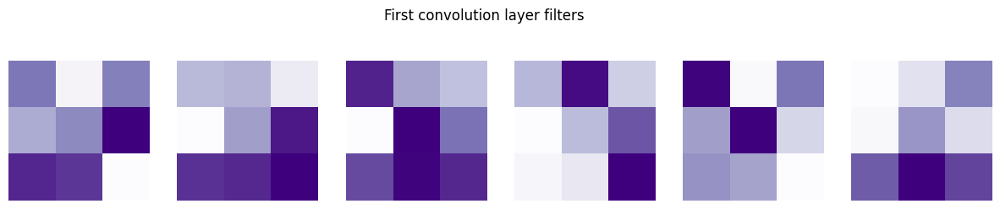

In [28]:
_, ax = plt.subplots(1, 6, figsize=(15, 3))

for i, ax in enumerate(ax.flatten()):
    ax.imshow(torch.squeeze(layer_1_weights[i, :, :, :]).detach(), cmap='Purples')
    ax.axis('off')
    
plt.suptitle("First convolution layer filters")
plt.show()

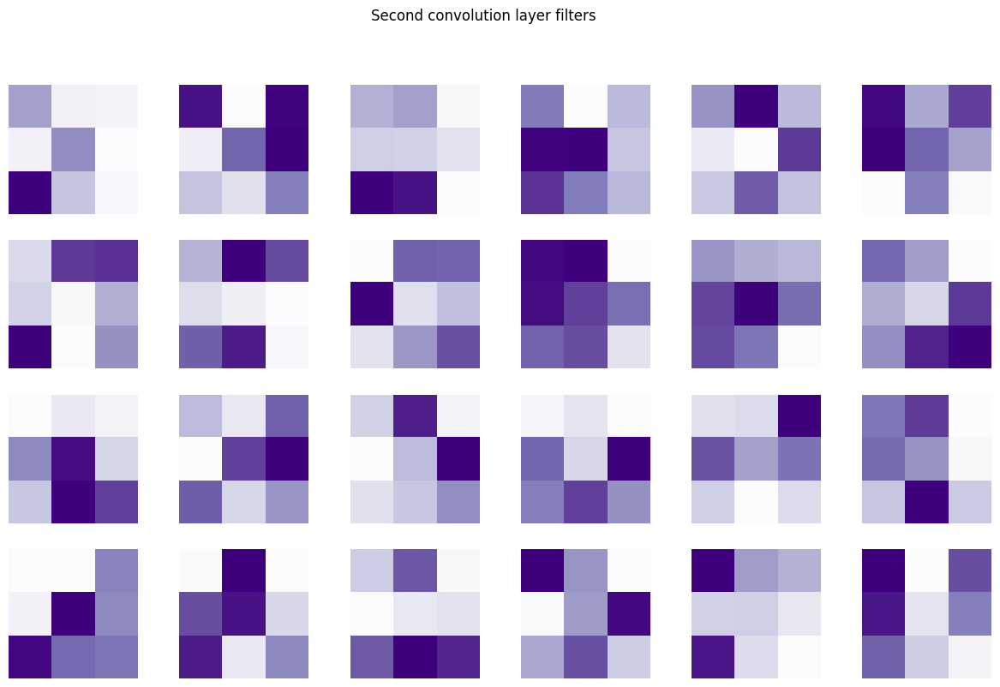

In [29]:
_, ax = plt.subplots(4, 6, figsize=(15, 9))

for i, ax in enumerate(ax.flatten()):
    index = np.unravel_index(i, (4, 6))

    ax.imshow(torch.squeeze(layer_3_weights[index[0], index[1], :, :]).detach(), cmap='Purples')
    ax.axis('off')
    
plt.suptitle("Second convolution layer filters")
plt.show()

## Examine feature map activations

In [30]:
def create_model():
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, 6, 3, 1, 1)
            self.conv2 = nn.Conv2d(6, 4, 3, 1, 1)
            self.fc1 = nn.Linear(22 * 22 * 4, 50)
            self.output = nn.Linear(50, 1)
            
        def forward(self, x_param):
            feature_map_1_local = F.relu(self.conv1(x_param))
            x_local = F.avg_pool2d(feature_map_1_local, (2, 2))
            
            feature_map_2_local = F.relu(self.conv2(x_local))
            x_local = F.avg_pool2d(feature_map_2_local, (2, 2))
            
            x_local = x_local.reshape(x_local.shape[0], -1)
            x_local = F.relu(self.fc1(x_local))
            x_local = self.output(x_local)
            
            return x_local, feature_map_1_local, feature_map_2_local
        
    gaussian_net_local = GaussianNet()
    loss_function_local = nn.BCEWithLogitsLoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)
    
    return gaussian_net_local, loss_function_local, optimizer_local

In [31]:
gaussian_net, loss_function, optimizer = create_model()
X, y = next(iter(train_loader))
y_pred, feature_map_1, feature_map_2 = gaussian_net(X)
loss = loss_function(y_pred, y)

print(f"Predicted category: {y_pred.shape}")
print(f"Feature map after conv1: {feature_map_1.shape}")
print(f"Feature map after conv2: {feature_map_2.shape}")

Predicted category: torch.Size([32, 1])
Feature map after conv1: torch.Size([32, 6, 91, 91])
Feature map after conv2: torch.Size([32, 4, 45, 45])


In [32]:
def train_model(gaussian_net_local, loss_function_local, optimizer_local):
    train_losses_local = []
    test_losses_local = []
    train_accuracies_local = []
    test_accuracies_local = []
     
    for epoch in range(10):
        batch_losses = []
        batch_accuracies = []
         
        gaussian_net_local.train()
         
        for X_local, y_local in train_loader:
            y_pred_local = gaussian_net_local(X_local)[0]
            loss_local = loss_function_local(y_pred_local, y_local)
               
            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()
            
            batch_losses.append(loss_local.item())
            batch_accuracies.append(torch.mean(((y_pred_local > 0) == y_local).float()).item())

        train_losses_local.append(np.mean(batch_losses))
        train_accuracies_local.append(100 * np.mean(batch_accuracies))

        gaussian_net_local.eval()
          
        X_local, y_local = next(iter(test_loader))
          
        with torch.no_grad():
            y_pred_local = gaussian_net_local(X_local)[0]
            loss_local = loss_function_local(y_pred_local, y_local)
          
        test_losses_local.append(loss_local.item())
        test_accuracies_local.append(100 * torch.mean(((y_pred_local > 0) == y_local).float()).item())
     
    return train_accuracies_local, test_accuracies_local, train_losses_local, test_losses_local, gaussian_net_local

In [33]:
gaussian_net, loss_function, optimizer = create_model()
train_accuracies, test_accuracies, train_losses, test_losses, _ = train_model(gaussian_net, loss_function, optimizer)

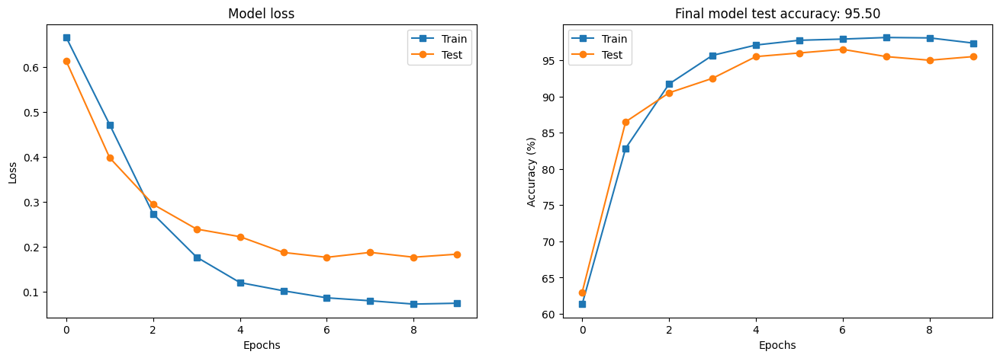

In [34]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(train_losses, 's-', label='Train')
ax[0].plot(test_losses, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")
ax[0].legend()

ax[1].plot(train_accuracies, 's-', label='Train')
ax[1].plot(test_accuracies, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Accuracy (%)")
ax[1].set_title(f"Final model test accuracy: {test_accuracies[-1]:.2f}")
ax[1].legend()

plt.show()

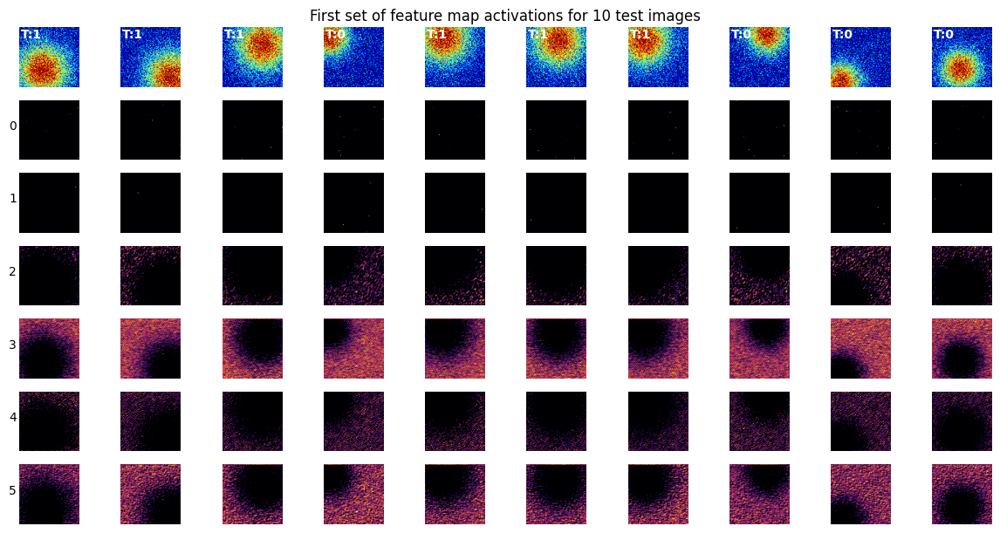

In [35]:
X, y = next(iter(test_loader))
y_pred, feature_map_1, feature_map_2 = gaussian_net(X)

_, ax = plt.subplots(7, 10, figsize=(12, 6))

for image_i in range(10):
    image = X[image_i, 0, :, :].detach()
    
    ax[0, image_i].imshow(image, cmap='jet', vmin=0, vmax=1)
    ax[0, image_i].axis('off')
    ax[0, image_i].text(2, 2, "T:%s" %int(y[image_i].item()), ha='left', va='top', color='w', fontweight='bold')
    
    for feature_map_i in range(6):
        image = feature_map_1[image_i, feature_map_i, :, :].detach()
        ax[feature_map_i + 1, image_i].imshow(image, cmap='inferno', vmin=0, vmax=torch.max(image) * .9)
        ax[feature_map_i + 1, image_i].axis('off')
        ax[feature_map_i + 1, image_i].text(-5, 45, feature_map_i, ha='right') if image_i == 0 else None

plt.tight_layout()
plt.suptitle("First set of feature map activations for 10 test images", x=.5, y=1.01)
plt.show()

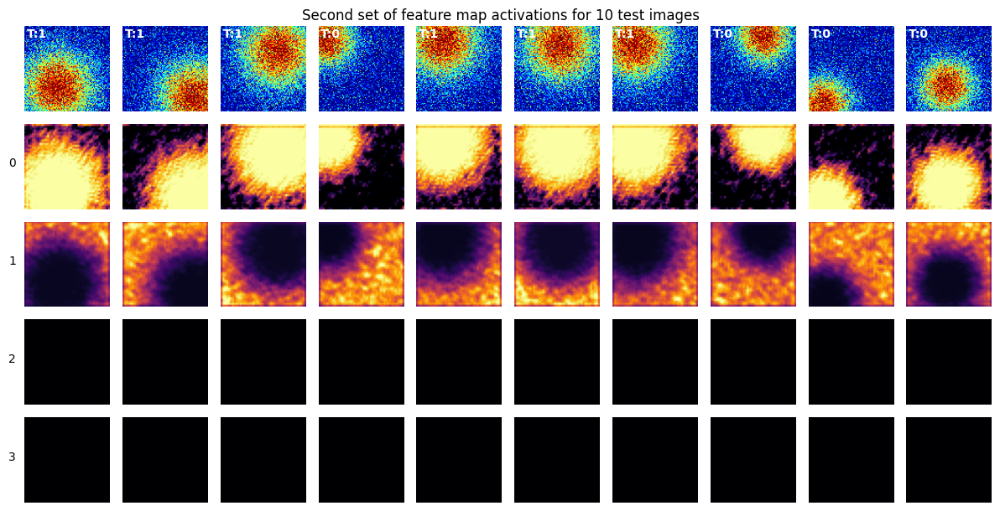

In [36]:
_, ax = plt.subplots(5, 10, figsize=(12, 6))

for image_i in range(10):
    image = X[image_i, 0, :, :].detach()
    
    ax[0, image_i].imshow(image, cmap='jet', vmin=0, vmax=1)
    ax[0, image_i].axis('off')
    ax[0, image_i].text(2, 2, "T:%s" %int(y[image_i].item()), ha='left', va='top', color='w', fontweight='bold')
    
    for feature_map_i in range(4):
        image = feature_map_2[image_i, feature_map_i, :, :].detach()
        ax[feature_map_i + 1, image_i].imshow(image, cmap='inferno', vmin=0, vmax=torch.max(image) * .9)
        ax[feature_map_i + 1, image_i].axis('off')
        ax[feature_map_i + 1, image_i].text(-5, 22, feature_map_i, ha='right') if image_i == 0 else None

plt.tight_layout()
plt.suptitle("Second set of feature map activations for 10 test images", x=.5, y=1.01)
plt.show()

In [37]:
stimulus_nr = feature_map_1.shape[0]
feature_map_nr = feature_map_1.shape[1]

row_index, col_index = np.triu_indices(feature_map_nr, 1)
correlation_nr = len(row_index)

pairwise_correlations = np.full((stimulus_nr, correlation_nr), np.nan)
correlation_sum = np.zeros((feature_map_nr, feature_map_nr))
valid_count = np.zeros((feature_map_nr, feature_map_nr))

for i in range(stimulus_nr):
    feature_maps = feature_map_1[i, :, :, :].view(feature_map_nr, -1).detach().numpy()

    with np.errstate(invalid='ignore'):
        correlation = np.corrcoef(feature_maps)

    valid = ~np.isnan(correlation)
    correlation_sum[valid] += correlation[valid]
    valid_count += valid
    pairwise_correlations[i, :] = correlation[row_index, col_index]

correlation_mean = np.divide(correlation_sum, valid_count, out=np.full_like(correlation_sum, np.nan), where=valid_count > 0)

x_labels = ["%s-%s" % (r, c) for r, c in zip(row_index, col_index)]

print(f"Images with at least one constant feature map: {np.isnan(pairwise_correlations).any(axis=1).sum()} / {stimulus_nr}")

Images with at least one constant feature map: 67 / 200


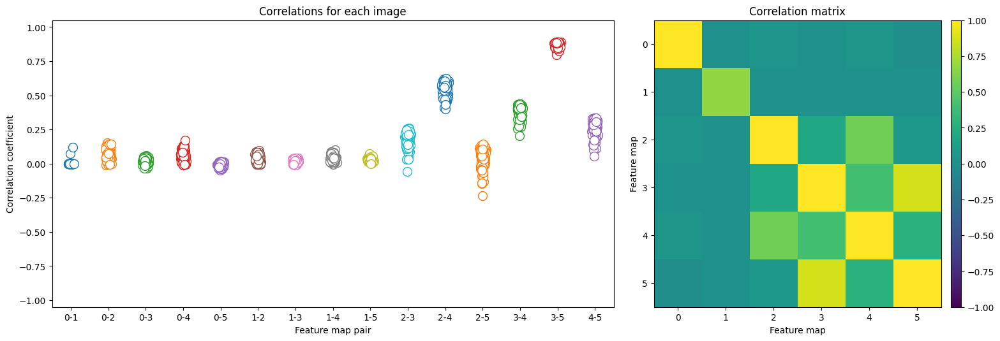

In [38]:
fig = plt.figure(figsize=(16, 5))
ax0 = fig.add_axes([.1, .1, .55, .9])
ax1 = fig.add_axes([.68, .1, .3, .9])
cax = fig.add_axes([.98, .1, .01, .9])

for i in range(correlation_nr):
    ax0.plot(i + np.random.randn(stimulus_nr) / 30, pairwise_correlations[:, i], 'o', markerfacecolor='w', markersize=10)

ax0.set_xlim([-.5, correlation_nr - .5])
ax0.set_ylim([-1.05, 1.05])
ax0.set_xticks(range(correlation_nr))
ax0.set_xticklabels(x_labels)
ax0.set_xlabel("Feature map pair")
ax0.set_ylabel("Correlation coefficient")
ax0.set_title("Correlations for each image")

h = ax1.imshow(correlation_sum / stimulus_nr, vmin=-1, vmax=1)

ax1.set_title("Correlation matrix")
ax1.set_xlabel("Feature map")
ax1.set_ylabel("Feature map")

fig.colorbar(h, cax=cax)

plt.show()

In [39]:
stimulus_nr = feature_map_2.shape[0]
feature_map_nr = feature_map_2.shape[1]

row_index, col_index = np.triu_indices(feature_map_nr, 1)
correlation_nr = len(row_index)

pairwise_correlations = np.full((stimulus_nr, correlation_nr), np.nan)
correlation_sum = np.zeros((feature_map_nr, feature_map_nr))
valid_count = np.zeros((feature_map_nr, feature_map_nr))

for i in range(stimulus_nr):
    feature_maps = feature_map_2[i, :, :, :].view(feature_map_nr, -1).detach().numpy()

    with np.errstate(invalid='ignore'):
        correlation = np.corrcoef(feature_maps)

    valid = ~np.isnan(correlation)
    correlation_sum[valid] += correlation[valid]
    valid_count += valid
    pairwise_correlations[i, :] = correlation[row_index, col_index]

correlation_mean = np.divide(correlation_sum, valid_count, out=np.full_like(correlation_sum, np.nan), where=valid_count > 0)

x_labels = ["%s-%s" % (r, c) for r, c in zip(row_index, col_index)]

print(f"Images with at least one constant feature map: {np.isnan(pairwise_correlations).any(axis=1).sum()} / {stimulus_nr}")

Images with at least one constant feature map: 200 / 200


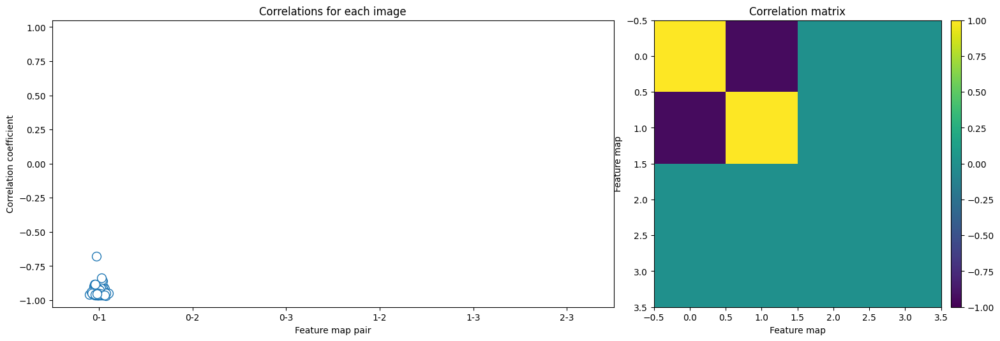

In [40]:
fig = plt.figure(figsize=(16, 5))
ax0 = fig.add_axes([.1, .1, .55, .9])
ax1 = fig.add_axes([.68, .1, .3, .9])
cax = fig.add_axes([.98, .1, .01, .9])

for i in range(correlation_nr):
    ax0.plot(i + np.random.randn(stimulus_nr) / 30, pairwise_correlations[:, i], 'o', markerfacecolor='w', markersize=10)

ax0.set_xlim([-.5, correlation_nr - .5])
ax0.set_ylim([-1.05, 1.05])
ax0.set_xticks(range(correlation_nr))
ax0.set_xticklabels(x_labels)
ax0.set_xlabel("Feature map pair")
ax0.set_ylabel("Correlation coefficient")
ax0.set_title("Correlations for each image")

h = ax1.imshow(correlation_sum / stimulus_nr, vmin=-1, vmax=1)

ax1.set_title("Correlation matrix")
ax1.set_xlabel("Feature map")
ax1.set_ylabel("Feature map")

fig.colorbar(h, cax=cax)

plt.show()

## CodeChallenge: Softcode internal parameters

In [41]:
def get_output_size(input_param, padding_param, kernel_size_param, stride_param):
    return np.floor((input_param + 2 * padding_param - kernel_size_param) / stride_param) + 1

conv1_out_channels = 3
conv2_out_channels = 6
kernel_size = (3, 2)
stride = (2, 3)
padding = 0
pool_kernel_size = (2, 2)

def create_model():
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, conv1_out_channels, kernel_size, stride, padding)
            
            conv1_output_x_size = get_output_size(image_size, padding, kernel_size[0], stride[0])
            conv1_output_y_size = get_output_size(image_size, padding, kernel_size[1], stride[1])
            conv1_output_x_size = np.floor(conv1_output_x_size / pool_kernel_size[0])
            conv1_output_y_size = np.floor(conv1_output_y_size / pool_kernel_size[1])
            
            self.conv2 = nn.Conv2d(conv1_out_channels, conv2_out_channels, kernel_size, stride, padding)
            
            conv2_output_x_size = get_output_size(conv1_output_x_size, padding, kernel_size[0], stride[0])
            conv2_output_y_size = get_output_size(conv1_output_y_size, padding, kernel_size[1], stride[1])
            conv2_output_x_size = np.floor(conv2_output_x_size / pool_kernel_size[0])
            conv2_output_y_size = np.floor(conv2_output_y_size / pool_kernel_size[1])
            
            self.fc1 = nn.Linear(int(conv2_output_x_size * conv2_output_y_size * conv2_out_channels), 50)
            self.output = nn.Linear(50, 1)
            
        def forward(self, x_param):
            feature_map_1_local = F.relu(self.conv1(x_param))
            x_local = F.avg_pool2d(feature_map_1_local, pool_kernel_size)
            
            feature_map_2_local = F.relu(self.conv2(x_local))
            x_local = F.avg_pool2d(feature_map_2_local, pool_kernel_size)
            
            x_local = x_local.reshape(x_local.shape[0], -1)
            x_local = F.relu(self.fc1(x_local))
            x_local = self.output(x_local)
            
            return x_local, feature_map_1_local, feature_map_2_local
    
    gaussian_net_local = GaussianNet()
    loss_function_local = nn.BCEWithLogitsLoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)
    
    return gaussian_net_local, loss_function_local, optimizer_local

In [42]:
gaussian_net, loss_function, optimizer = create_model()
X, y = next(iter(train_loader))
y_pred, feature_map_1, feature_map_2 = gaussian_net(X)
loss = loss_function(y_pred, y)

print(f"Predicted category: {y_pred.shape}")
print(f"Feature map after conv1: {feature_map_1.shape}")
print(f"Feature map after conv2: {feature_map_2.shape}")

Predicted category: torch.Size([32, 1])
Feature map after conv1: torch.Size([32, 3, 45, 30])
Feature map after conv2: torch.Size([32, 6, 10, 5])


## CodeChallenge: How wide the FC?

In [43]:
device = torch.device('mps' if torch.mps.is_available() else 'cpu')

In [44]:
def create_model(units_nr_param):
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()

            self.conv1 = nn.Conv2d(1, 6, 3, 1, 1)
            self.conv2 = nn.Conv2d(6, 4, 3, 1, 1)
            self.fc1 = nn.Linear(22 * 22 * 4, 2 * units_nr_param)
            self.fc2 = nn.Linear(2 * units_nr_param, units_nr_param)
            self.output = nn.Linear(units_nr_param, 1)

        def forward(self, x_param):
            feature_map_1_local = F.relu(self.conv1(x_param))
            x_local = F.avg_pool2d(feature_map_1_local, (2, 2))

            feature_map_2_local = F.relu(self.conv2(x_local))
            x_local = F.avg_pool2d(feature_map_2_local, (2, 2))

            x_local = x_local.reshape(x_local.shape[0], -1)
            x_local = F.relu(self.fc1(x_local))
            x_local = F.relu(self.fc2(x_local))
            x_local = self.output(x_local)

            return x_local, feature_map_1_local, feature_map_2_local

    gaussian_net_local = GaussianNet().to(device)
    loss_function_local = nn.BCEWithLogitsLoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)

    return gaussian_net_local, loss_function_local, optimizer_local

In [45]:
train_data, test_data, train_labels, test_labels = train_test_split(images.to(device), labels.to(device), test_size=.1)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_dataset.tensors[0].shape[0])

In [46]:
unit_nrs = np.linspace(5, 500, 10, dtype=int)
all_train_accuracies = []
all_test_accuracies = []
all_train_losses = []
all_test_losses = []

for unit_nr in unit_nrs:
    gaussian_net, loss_function, optimizer = create_model(unit_nr)
    train_accuracies, test_accuracies, train_losses, test_losses, _ = train_model(gaussian_net, loss_function, optimizer)

    all_train_accuracies.append(train_accuracies[-1])
    all_test_accuracies.append(test_accuracies[-1])
    all_train_losses.append(train_losses[-1])
    all_test_losses.append(test_losses[-1])

    print(f"Finished units number: {unit_nr}")

Finished units number: 5
Finished units number: 60
Finished units number: 115
Finished units number: 170
Finished units number: 225
Finished units number: 280
Finished units number: 335
Finished units number: 390
Finished units number: 445
Finished units number: 500


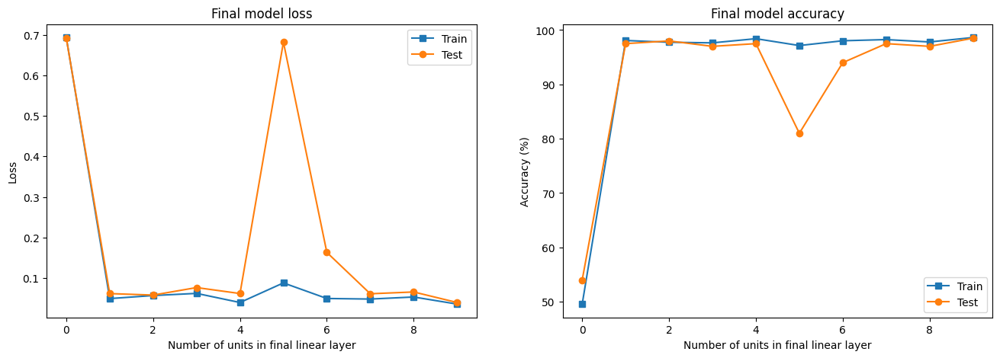

In [47]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(all_train_losses, 's-', label='Train')
ax[0].plot(all_test_losses, 'o-', label='Test')
ax[0].set_xlabel("Number of units in final linear layer")
ax[0].set_ylabel('Loss')
ax[0].set_title("Final model loss")
ax[0].legend()

ax[1].plot(all_train_accuracies, 's-', label='Train')
ax[1].plot(all_test_accuracies, 'o-', label='Test')
ax[1].set_xlabel("Number of units in final linear layer")
ax[1].set_ylabel("Accuracy (%)")
ax[1].set_title(f"Final model accuracy")
ax[1].legend()

plt.show()

## Do autoencoders clean Gaussians?

In [48]:
def create_model():
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()

            self.enc = nn.Sequential(
                nn.Conv2d(1, 6, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
                nn.Conv2d(6, 4, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
            )

            self.dec = nn.Sequential(
                nn.ConvTranspose2d(4, 6, 3, 2),
                nn.ReLU(),
                nn.ConvTranspose2d(6, 1, 3, 2),
            )

        def forward(self, x_param):
            return self.dec(self.enc(x_param))

    gaussian_net_local = GaussianNet()
    loss_function_local = nn.MSELoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)

    return gaussian_net_local, loss_function_local, optimizer_local

In [49]:
images_nr = 1000
image_size = 91
x = np.linspace(-4, 4, image_size)
X, Y = np.meshgrid(x, x)
widths = np.linspace(2, 20, images_nr)

images = torch.zeros(images_nr, 1, image_size, image_size)

for i in range(images_nr):
    random_offset = 1.5 * np.random.randn(2)
    gaussian = np.exp(-((X - random_offset[0]) ** 2 + (Y - random_offset[1]) ** 2) / widths[i])
    gaussian = gaussian + np.random.randn(image_size, image_size) / 5

    index_1 = np.random.choice(np.arange(2, 28))
    index_2 = np.random.choice(np.arange(2, 6))

    if np.random.randn() > 0:
        gaussian[index_1:index_1 + index_2,] = 1
    else:
        gaussian[:, index_1:index_1 + index_2] = 1

    images[i, :, :, :] = torch.Tensor(gaussian).view(1, image_size, image_size)

In [50]:
images.shape

torch.Size([1000, 1, 91, 91])

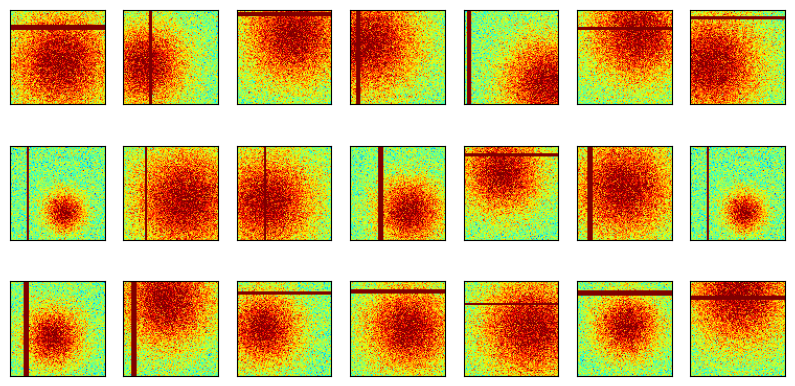

In [51]:
_, ax = plt.subplots(3, 7, figsize=(10, 5))

for i, ax in enumerate(ax.flatten()):
    index = np.random.randint(images_nr)
    image = np.squeeze(images[index, :, :])

    ax.imshow(image, vmin=-1, vmax=1, cmap='jet')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [52]:
gaussian_net, loss_function, optimizer = create_model()
y_pred = gaussian_net(images[:10, :, :, :])

print(images[:10, :, :, :].shape)
print(y_pred.shape)

torch.Size([10, 1, 91, 91])
torch.Size([10, 1, 91, 91])


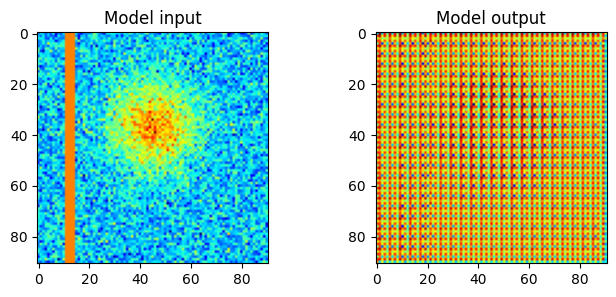

In [53]:
_, ax = plt.subplots(1, 2, figsize=(8, 3))

ax[0].imshow(torch.squeeze(images[0, 0, :, :]).detach(), cmap='jet')
ax[0].set_title("Model input")

ax[1].imshow(torch.squeeze(y_pred[0, 0, :, :]).detach(), cmap='jet')
ax[1].set_title("Model output")

plt.show()

In [54]:
summary(gaussian_net, (1, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
   ConvTranspose2d-7            [-1, 6, 45, 45]             222
              ReLU-8            [-1, 6, 45, 45]               0
   ConvTranspose2d-9            [-1, 1, 91, 91]              55
Total params: 557
Trainable params: 557
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.24
Params size (MB): 0.00
Estimated Total Size (MB): 1.27
---------------------------------------------------

In [55]:
def train_model(gaussian_net_local, loss_function_local, optimizer_local):
    losses_local = []

    for epoch in range(500):
        image_indexes_local = np.random.choice(images_nr, size=32, replace=False)
        X_local = images[image_indexes_local, :, :, :]

        y_pred_local = gaussian_net_local(X_local)
        loss_local = loss_function_local(y_pred_local, X_local)

        losses_local.append(loss_local.item())

        optimizer_local.zero_grad()
        loss_local.backward()
        optimizer_local.step()

    return losses_local, gaussian_net_local

In [56]:
gaussian_net, loss_function, optimizer = create_model()
losses, _ = train_model(gaussian_net, loss_function, optimizer)

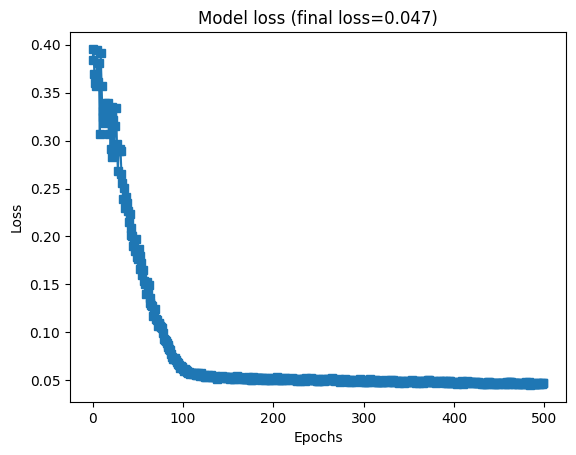

In [57]:
plt.plot(losses, 's-', label='Train')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Model loss (final loss=%.3f)" %losses[-1])

plt.show()

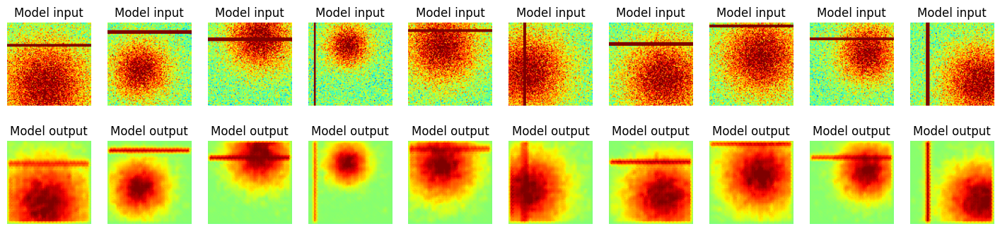

In [58]:
image_indexes = np.random.choice(images_nr, size=32, replace=False)
X = images[image_indexes, :, :, :]
y_pred = gaussian_net(X)

_, ax = plt.subplots(2, 10, figsize=(18, 4))

for i in range(10):
    selected_input = torch.squeeze(X[i, 0, :, :]).detach()
    selected_output = torch.squeeze(y_pred[i, 0, :, :]).detach()

    ax[0, i].imshow(selected_input, vmin=-1, vmax=1, cmap='jet')
    ax[0, i].axis('off')
    ax[0, i].set_title("Model input")

    ax[1, i].imshow(selected_output, vmin=-1, vmax=1, cmap='jet')
    ax[1, i].axis('off')
    ax[1, i].set_title("Model output")

plt.show()

## CodeChallenge: AEs and occluded Gaussians

In [59]:
images_nr = 1000
image_size = 91
x = np.linspace(-4, 4, image_size)
X, Y = np.meshgrid(x, x)
widths = np.linspace(2, 20, images_nr)

images = torch.zeros(images_nr, 1, image_size, image_size)
images_without_occlusion = torch.zeros(images_nr, 1, image_size, image_size)

for i in range(images_nr):
    random_offset = 1.5 * np.random.randn(2)
    gaussian = np.exp(-((X - random_offset[0]) ** 2 + (Y - random_offset[1]) ** 2) / widths[i])
    gaussian = gaussian + np.random.randn(image_size, image_size) / 5
    images_without_occlusion[i, :, :, :] = torch.Tensor(gaussian).view(1, image_size, image_size)

    index_1 = np.random.choice(np.arange(2, 28))
    index_2 = np.random.choice(np.arange(2, 6))

    if np.random.randn() > 0:
        gaussian[index_1:index_1 + index_2,] = 1
    else:
        gaussian[:, index_1:index_1 + index_2] = 1

    images[i, :, :, :] = torch.Tensor(gaussian).view(1, image_size, image_size)

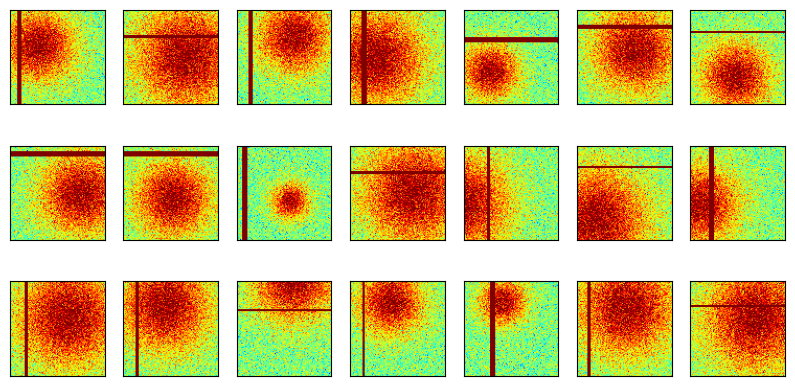

In [60]:
_, ax = plt.subplots(3, 7, figsize=(10, 5))

for i, ax in enumerate(ax.flatten()):
    index = np.random.randint(images_nr)
    image = np.squeeze(images[index, :, :])

    ax.imshow(image, vmin=-1, vmax=1, cmap='jet')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [61]:
def train_model(gaussian_net_local, loss_function_local, optimizer_local):
    losses_local = []

    for epoch in range(500):
        image_indexes_local = np.random.choice(images_nr, size=32, replace=False)
        X_local = images[image_indexes_local, :, :, :]
        X_without_occlusion_local = images_without_occlusion[image_indexes_local, :, :, :]

        y_pred_local = gaussian_net_local(X_local)
        loss_local = loss_function_local(y_pred_local, X_without_occlusion_local)

        losses_local.append(loss_local.item())

        optimizer_local.zero_grad()
        loss_local.backward()
        optimizer_local.step()

    return losses_local, gaussian_net_local

In [62]:
gaussian_net, loss_function, optimizer = create_model()
losses, _ = train_model(gaussian_net, loss_function, optimizer)

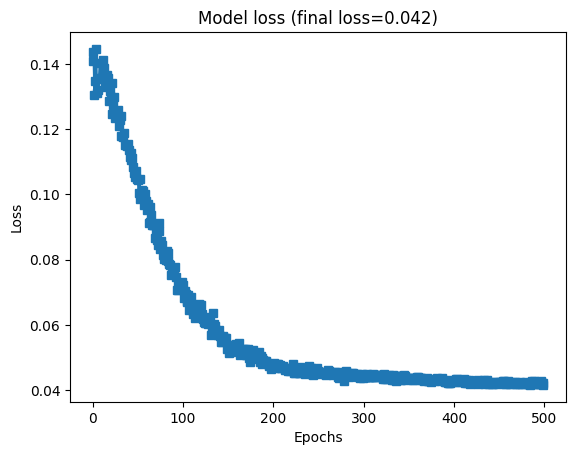

In [63]:
plt.plot(losses, 's-', label='Train')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Model loss (final loss=%.3f)" %losses[-1])

plt.show()

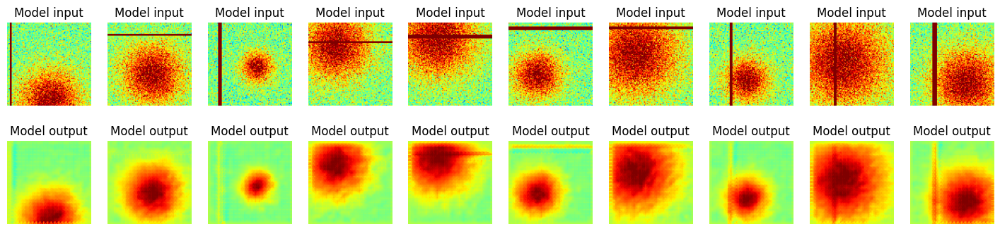

In [64]:
image_indexes = np.random.choice(images_nr, size=32, replace=False)
X = images[image_indexes, :, :, :]
y_pred = gaussian_net(X)

_, ax = plt.subplots(2, 10, figsize=(18, 4))

for i in range(10):
    selected_input = torch.squeeze(X[i, 0, :, :]).detach()
    selected_output = torch.squeeze(y_pred[i, 0, :, :]).detach()

    ax[0, i].imshow(selected_input, vmin=-1, vmax=1, cmap='jet')
    ax[0, i].axis('off')
    ax[0, i].set_title("Model input")

    ax[1, i].imshow(selected_output, vmin=-1, vmax=1, cmap='jet')
    ax[1, i].axis('off')
    ax[1, i].set_title("Model output")

plt.show()

## CodeChallenge: Custom loss functions

In [65]:
class MAELoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, y_pred_param, y_param):
        n = y_pred_param.numel()
        nominator = torch.sum(torch.absolute((y_pred_param - y_param)))

        return nominator / n

class MSEModifiedLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, y_pred_param, y_param):
        n = y_pred_param.numel()
        first_nominator = torch.sum((y_pred_param - y_param) ** 2)
        second_nominator = torch.absolute(torch.sum(y_pred_param))

        return first_nominator / n + second_nominator / n

class CorrelationLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, y_pred_param, y_param):
        n = y_pred_param.numel()
        y_pred_mean = torch.mean(y_pred_param)
        y_mean = torch.mean(y_param)
        y_pred_standard_deviation = torch.std(y_pred_param)
        y_standard_deviation = torch.std(y_param)
        nominator = torch.sum((y_pred_param - y_pred_mean) * (y_param - y_mean))
        denominator = (n - 1) * y_pred_standard_deviation * y_standard_deviation

        return -(nominator / denominator)

## Discover the Gaussian parameters

In [66]:
images_nr = 1000
image_size = 91
x = np.linspace(-4, 4, image_size)
X, Y = np.meshgrid(x, x)

images = torch.zeros(images_nr, 1, image_size, image_size)
labels = torch.zeros(images_nr, 3)

for i in range(images_nr):
    random_offset = 2 * np.random.randn(2)
    width = np.random.rand() * 10 + 5

    gaussian = np.exp(-((X - random_offset[0]) ** 2 + (Y - random_offset[1]) ** 2) / width)
    gaussian = gaussian + np.random.randn(image_size, image_size) / 10

    images[i, :, :, :] = torch.Tensor(gaussian).view(1, image_size, image_size)
    labels[i, :] = torch.Tensor([random_offset[0], random_offset[1], width])

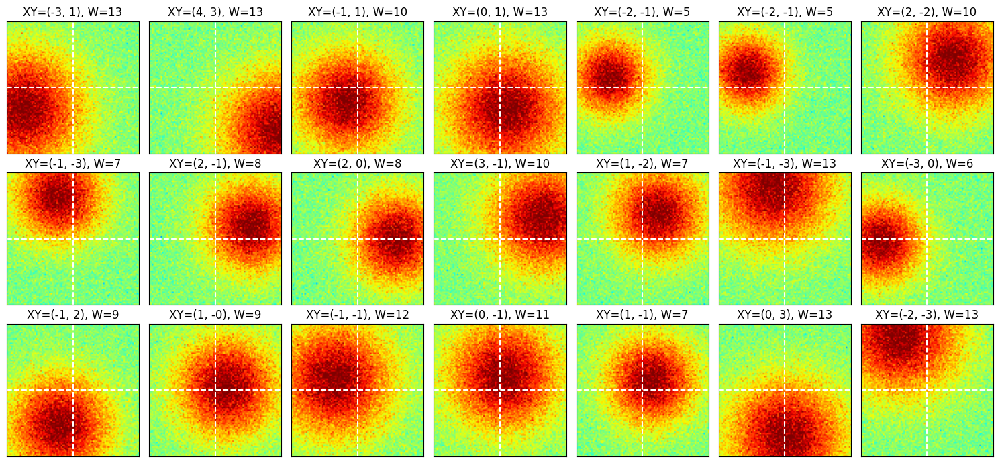

In [67]:
_, axs = plt.subplots(3, 7, figsize=(15, 7))

for i, ax in enumerate(axs.flatten()):
    index = np.random.randint(images_nr)
    image = np.squeeze(images[index, :, :])

    ax.imshow(image, vmin=-1, vmax=1, cmap='jet', extent=[-4, 4, -4, 4], origin='upper')
    ax.set_title(f"XY=({labels[index, 0]:.0f}, {labels[index, 1]:.0f}), W={labels[index, 2]:.0f}")
    ax.plot([-4, 4], [0, 0], 'w--')
    ax.plot([0, 0], [-4, 4], 'w--')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

In [68]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_dataset.tensors[0].shape[0])

In [69]:
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)

torch.Size([900, 1, 91, 91])
torch.Size([900, 3])


In [70]:
def create_model():
    class GaussianNet(nn.Module):
        def __init__(self):
            super().__init__()

            self.enc = nn.Sequential(
                nn.Conv2d(1, 6, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
                nn.Conv2d(6, 4, 3, 1, 1),
                nn.ReLU(),
                nn.AvgPool2d(2, 2),
                nn.Flatten(),
                nn.Linear(22 * 22 * 4, 50),
                nn.Linear(50, 3)
            )

        def forward(self, x_param):
            return self.enc(x_param)

    gaussian_net_local = GaussianNet()
    loss_function_local = nn.MSELoss()
    optimizer_local = torch.optim.Adam(gaussian_net_local.parameters(), lr=.001)

    return gaussian_net_local, loss_function_local, optimizer_local

In [71]:
gaussian_net, loss_function, _ = create_model()

X, y = next(iter(train_loader))
y_pred = gaussian_net(X)

print(f"Output shape: {y_pred.shape}")

loss = loss_function(y_pred, y)

print()
print(f"Loss: {loss}")

Output shape: torch.Size([16, 3])

Loss: 32.33323669433594


In [72]:
summary(gaussian_net, (1, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
           Flatten-7                 [-1, 1936]               0
            Linear-8                   [-1, 50]          96,850
            Linear-9                    [-1, 3]             153
Total params: 97,283
Trainable params: 97,283
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.00
Params size (MB): 0.37
Estimated Total Size (MB): 1.41
---------------------------------------------

In [73]:
def train_model(gaussian_net_local, loss_function_local, optimizer_local):
    train_losses_local = []
    test_losses_local = []

    for epoch in range(30):
        batch_losses = []

        gaussian_net_local.train()

        for X_local, y_local in train_loader:
            y_pred_local = gaussian_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)

            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()

            batch_losses.append(loss_local.item())

        train_losses_local.append(np.mean(batch_losses))

        gaussian_net_local.eval()

        X_local, y_local = next(iter(test_loader))

        with torch.no_grad():
            y_pred_local = gaussian_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)

        test_losses_local.append(loss_local.item())

    return train_losses_local, test_losses_local, gaussian_net_local

In [74]:
gaussian_net, loss_function, optimizer = create_model()
train_losses, test_losses, _ = train_model(gaussian_net, loss_function, optimizer)

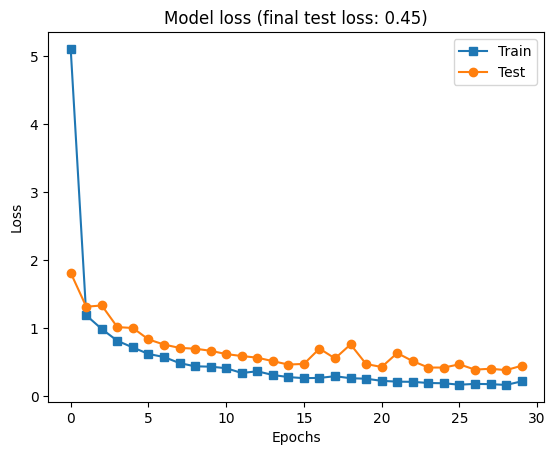

In [75]:
plt.plot(train_losses, 's-', label='Train')
plt.plot(test_losses, 'o-', label='Test')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Model loss (final test loss: %.2f)" %test_losses[-1])
plt.legend()

plt.show()

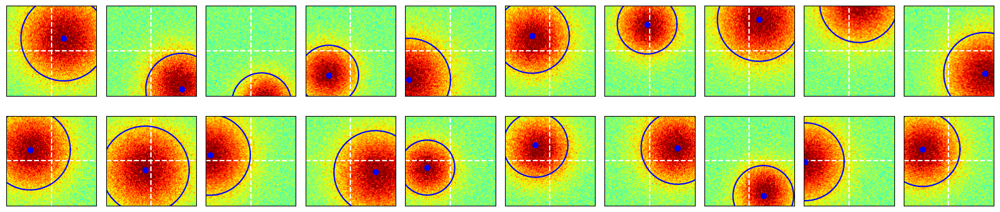

In [76]:
X, y = next(iter(test_loader))
y_pred = gaussian_net(X)
theta = np.linspace(0, 2 * np.pi)

_, axs = plt.subplots(2, 10, figsize=(16, 4))

for i, ax in enumerate(axs.flatten()):
  gaussian = torch.squeeze(X[i, 0, :, :]).detach()

  ax.imshow(gaussian, vmin=-1, vmax=1, cmap='jet', extent=[-4, 4, -4, 4], origin='lower')
  ax.plot([-4, 4], [0, 0], 'w--')
  ax.plot([0, 0], [-4, 4], 'w--')

  center_x = y_pred[i][0].item()
  center_y = y_pred[i][1].item()
  radius = y_pred[i][2].item()

  position_x = center_x + np.cos(theta) * np.sqrt(radius)
  position_y = center_y + np.sin(theta) * np.sqrt(radius)

  ax.plot(position_x, position_y, 'b')
  ax.plot(center_x, center_y, 'bo')
  ax.set_xticks([])
  ax.set_yticks([])
  ax.set_xlim([-4, 4])
  ax.set_ylim([-4, 4])

plt.tight_layout()
plt.show()

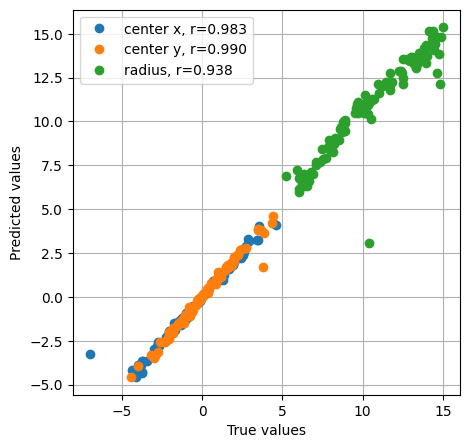

In [77]:
plt.figure(figsize=(5, 5))

parameters = ["center x", "center y", 'radius']

for i in range(3):
  y_values = y[:, i].detach()
  y_pred_values = y_pred[:, i].detach()
  correlation = np.corrcoef(y_values, y_pred_values)[0, 1]

  plt.plot(y_values, y_pred_values, 'o', label=f"{parameters[i]}, r={correlation:.3f}")

plt.legend()
plt.xlabel("True values")
plt.ylabel("Predicted values")
plt.grid()
plt.show()

## The EMNIST dataset (letter recognition)

In [78]:
emnist = torchvision.datasets.EMNIST(root='emnist', split='letters', download=True)

In [79]:
print(emnist.classes)
print(f"{str(len(emnist.classes))} classes")
print(f"Data size: {emnist.data.shape}")

images = emnist.data.view([124800, 1, 28, 28]).float()

print(f"Tensor data: {images.shape}")

['N/A', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
27 classes
Data size: torch.Size([124800, 28, 28])
Tensor data: torch.Size([124800, 1, 28, 28])


In [80]:
print(torch.sum(emnist.targets == 0))
print(torch.unique(emnist.targets))

tensor(0)
tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21, 22, 23, 24, 25, 26])


In [81]:
letter_labels = emnist.classes[1:]
labels = copy.deepcopy(emnist.targets) - 1

print(labels.shape)
print(torch.sum(labels == 0))
print(torch.unique(labels))

torch.Size([124800])
tensor(4800)
tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25])


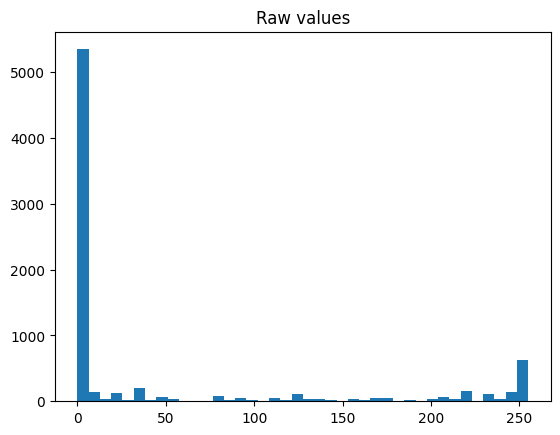

In [82]:
plt.hist(images[:10, :, :, :].view(1, -1).detach().flatten(), 40)
plt.title("Raw values")
plt.show()

In [83]:
images = images / torch.max(images)

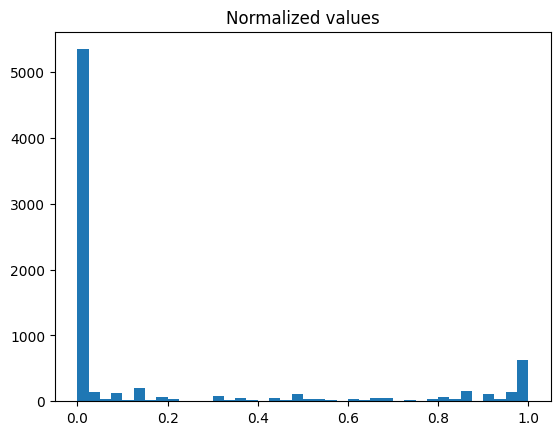

In [84]:
plt.hist(images[:10, :, :, :].view(1, -1).detach().flatten(), 40)
plt.title("Normalized values")
plt.show()

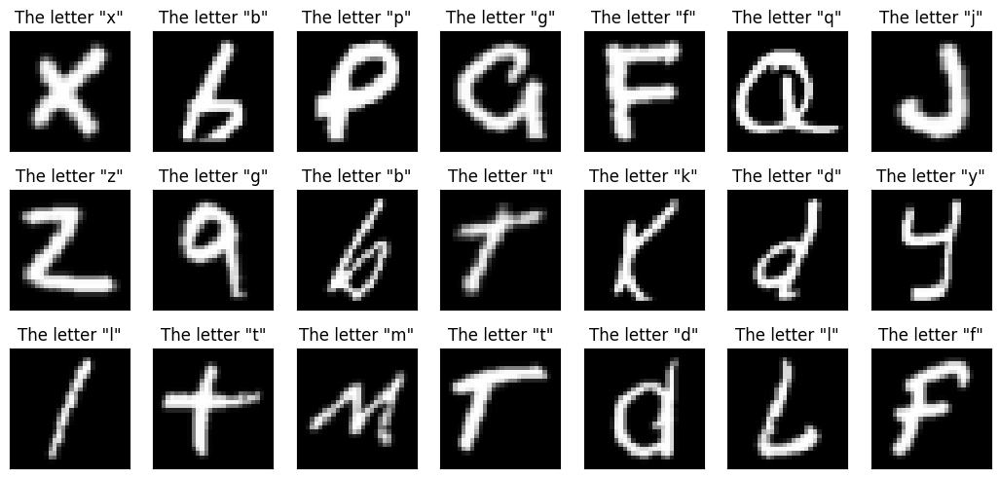

In [85]:
_, axs = plt.subplots(3, 7, figsize=(13, 6))

for i, ax in enumerate(axs.flatten()):
  index = np.random.randint(images.shape[0])
  image = np.squeeze(images[index, :, :])
  letter = letter_labels[labels[index]]

  ax.imshow(image.T, cmap='gray')
  ax.set_title(f"The letter \"{letter}\"")
  ax.set_xticks([])
  ax.set_yticks([])

plt.show()

In [86]:
train_data, test_data, train_labels, test_labels = train_test_split(images.to(device), labels.to(device), test_size=.1)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=test_dataset.tensors[0].shape[0])

In [87]:
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)

torch.Size([112320, 1, 28, 28])
torch.Size([112320])


In [88]:
def create_model(print_toggle_param=False):
    class EmnistNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, 6, 3, 1, 1)
            self.bnorm1 = nn.BatchNorm2d(6)

            self.conv2 = nn.Conv2d(6, 6, 3, 1, 1)
            self.bnorm2 = nn.BatchNorm2d(6)
            
            self.fc1 = nn.Linear(7 * 7 * 6, 50)
            self.output = nn.Linear(50, 26)
            
        def forward(self, x_param):
            if print_toggle_param: print(f"Input: {x_param.shape}")
            
            x_local = F.max_pool2d(self.conv1(x_param), 2)
            x_local = F.leaky_relu(self.bnorm1(x_local))
            
            if print_toggle_param: print(f"First CPR block: {x_local.shape}")
            
            x_local = F.max_pool2d(self.conv2(x_local), 2)
            x_local = F.leaky_relu(self.bnorm2(x_local))
            
            if print_toggle_param: print(f"Second CPR block: {x_local.shape}")
            
            x_local = torch.flatten(x_local, start_dim=1)
            
            if print_toggle_param: print(f"Vectorized: {x_local.shape}")
            
            x_local = F.leaky_relu(self.fc1(x_local))
            x_local = self.output(x_local)
            
            if print_toggle_param: print(f"Final output: {x_local.shape}")
            
            return x_local
        
    emnist_net_local = EmnistNet().to(device)
    loss_function_local = nn.CrossEntropyLoss()
    optimizer_local = torch.optim.Adam(emnist_net_local.parameters(), lr=.001)
    
    return emnist_net_local, loss_function_local, optimizer_local

In [89]:
emnist_net, loss_function, _ = create_model(True)

X, y = next(iter(train_loader))
y_pred = emnist_net(X)

print()
print(f"Output shape: {y_pred.shape}")

loss = loss_function(y_pred, y)

print()
print(f"Loss: {loss}")

Input: torch.Size([32, 1, 28, 28])
First CPR block: torch.Size([32, 6, 14, 14])
Second CPR block: torch.Size([32, 6, 7, 7])
Vectorized: torch.Size([32, 294])
Final output: torch.Size([32, 26])

Output shape: torch.Size([32, 26])

Loss: 3.299229621887207


In [90]:
def train_model(emnist_net_local, loss_function_local, optimizer_local):
    train_losses_local = []
    test_losses_local = []
    train_error_rates_local = []
    test_error_rates_local = []
     
    for epoch in range(10):
        batch_losses = []
        batch_error_rates = []
         
        emnist_net_local.train()
         
        for X_local, y_local in train_loader:
            y_pred_local = emnist_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
               
            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()
            
            batch_losses.append(loss_local.item())
            batch_error_rates.append(torch.mean((torch.argmax(y_pred_local, axis=1) != y_local).float()).item())

        train_losses_local.append(np.mean(batch_losses))
        train_error_rates_local.append(100 * np.mean(batch_error_rates))

        emnist_net_local.eval()
          
        X_local, y_local = next(iter(test_loader))
          
        with torch.no_grad():
            y_pred_local = emnist_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
          
        test_losses_local.append(loss_local.item())
        test_error_rates_local.append(100 * torch.mean((torch.argmax(y_pred_local, axis=1) != y_local).float()).item())
     
    return train_error_rates_local, test_error_rates_local, train_losses_local, test_losses_local, emnist_net_local

In [91]:
emnist_net, loss_function, optimizer = create_model()
train_error_rates, test_error_rates, train_losses, test_losses, _ = train_model(emnist_net, loss_function, optimizer)

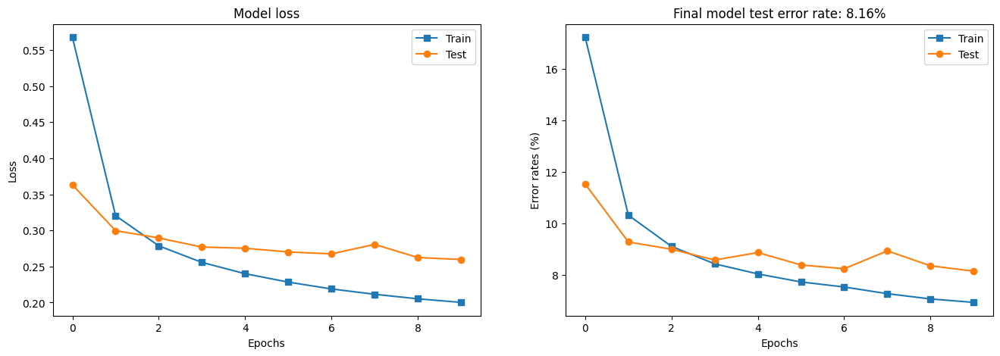

In [92]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(train_losses, 's-', label='Train')
ax[0].plot(test_losses, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")
ax[0].legend()

ax[1].plot(train_error_rates, 's-', label='Train')
ax[1].plot(test_error_rates, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Error rates (%)")
ax[1].set_title(f"Final model test error rate: {test_error_rates[-1]:.2f}%")
ax[1].legend()

plt.show()

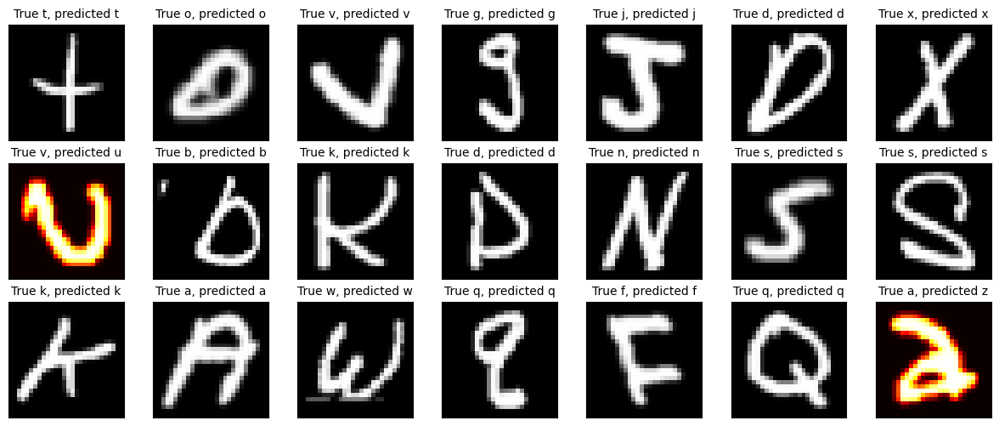

In [93]:
X, y = next(iter(test_loader))
y_pred = emnist_net(X)

indexes = np.random.choice(len(y), size=21, replace=False)

_, axs = plt.subplots(3, 7, figsize=(15, 6))

for i, ax in enumerate(axs.flatten()):
    image = np.squeeze(X[indexes[i], 0, :, :]).cpu()
    letter = letter_labels[y[indexes[i]]]
    letter_pred = letter_labels[torch.argmax(y_pred[indexes[i], :])]

    col = 'gray' if letter == letter_pred else 'hot'

    ax.imshow(image.T, cmap=col)
    ax.set_title("True %s, predicted %s" %(letter, letter_pred), fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

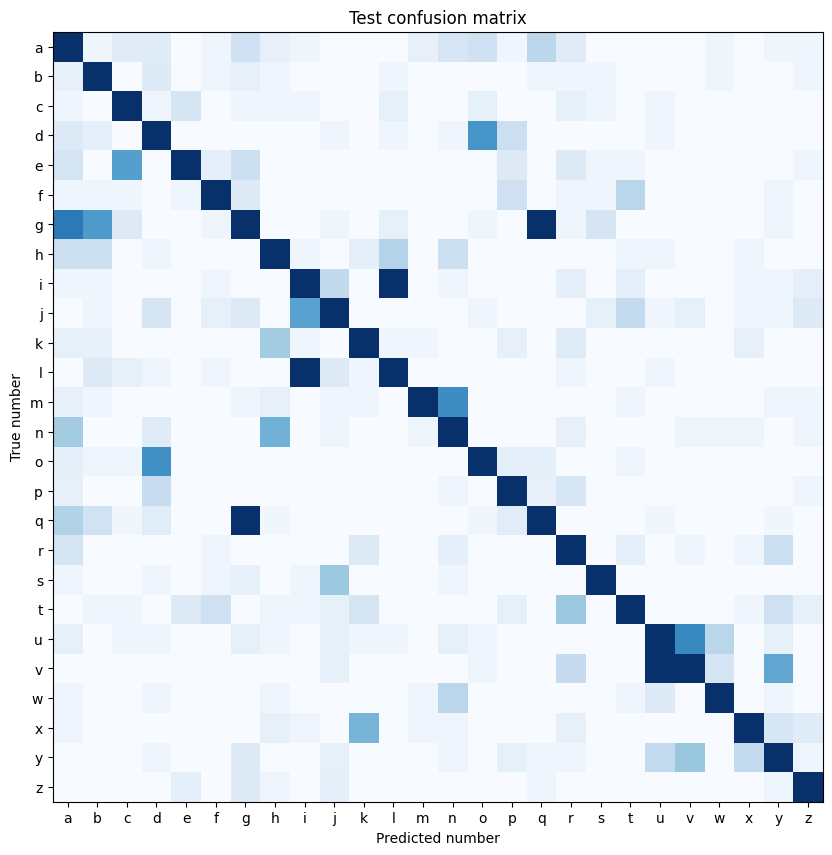

In [94]:
confusion_matrix = skm.confusion_matrix(y.cpu(), torch.argmax(y_pred.cpu(), axis=1), normalize='true')

plt.figure(figsize=(10, 10))
plt.imshow(confusion_matrix, 'Blues', vmax=.05)
plt.xticks(range(26), labels=letter_labels)
plt.yticks(range(26), labels=letter_labels)
plt.xlabel("Predicted number")
plt.ylabel("True number")
plt.title("Test confusion matrix")

plt.show()

## CodeChallenge: How low can you go?

In [95]:
def create_model(print_toggle_param=False):
    class EmnistNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, 32, 3, 1, 1)
            self.bnorm1 = nn.BatchNorm2d(32)

            self.conv2 = nn.Conv2d(32, 64, 3, 1, 1)
            self.bnorm2 = nn.BatchNorm2d(64)
     
            self.conv3 = nn.Conv2d(64, 128, 3, 1, 1)
            self.bnorm3 = nn.BatchNorm2d(128)
            
            self.fc1 = nn.Linear(1152, 256)
            self.dropout = nn.Dropout(.6)
            self.output = nn.Linear(256, 26)
            
        def forward(self, x_param):
            if print_toggle_param: print(f"Input: {x_param.shape}")

            x_local = self.bnorm1(self.conv1(x_param))
            x_local = F.max_pool2d(F.leaky_relu(x_local), 2)
            
            if print_toggle_param: print(f"First CPR block: {x_local.shape}")
            
            x_local = self.bnorm2(self.conv2(x_local))
            x_local = F.max_pool2d(F.leaky_relu(x_local), 2)
            
            if print_toggle_param: print(f"Second CPR block: {x_local.shape}")
            
            x_local = self.bnorm3(self.conv3(x_local))
            x_local = F.max_pool2d(F.leaky_relu(x_local), 2)
            
            if print_toggle_param: print(f"Third CPR block: {x_local.shape}")
            
            x_local = torch.flatten(x_local, start_dim=1)
            
            if print_toggle_param: print(f"Vectorized: {x_local.shape}")
            
            x_local = F.leaky_relu(self.fc1(x_local))
            x_local = self.dropout(x_local)
            x_local = self.output(x_local)
            
            if print_toggle_param: print(f"Final output: {x_local.shape}")
            
            return x_local
        
    emnist_net_local = EmnistNet().to(device)
    loss_function_local = nn.CrossEntropyLoss()
    optimizer_local = torch.optim.Adam(emnist_net_local.parameters(), lr=.001)
    
    return emnist_net_local, loss_function_local, optimizer_local

In [96]:
emnist_net, loss_function, _ = create_model(True)

X, y = next(iter(train_loader))
y_pred = emnist_net(X)

print()
print(f"Output shape: {y_pred.shape}")

loss = loss_function(y_pred, y)

print()
print(f"Loss: {loss}")

Input: torch.Size([32, 1, 28, 28])
First CPR block: torch.Size([32, 32, 14, 14])
Second CPR block: torch.Size([32, 64, 7, 7])
Third CPR block: torch.Size([32, 128, 3, 3])
Vectorized: torch.Size([32, 1152])
Final output: torch.Size([32, 26])

Output shape: torch.Size([32, 26])

Loss: 3.350274085998535


In [97]:
emnist_net, loss_function, optimizer = create_model()
train_error_rates, test_error_rates, train_losses, test_losses, _ = train_model(emnist_net, loss_function, optimizer)

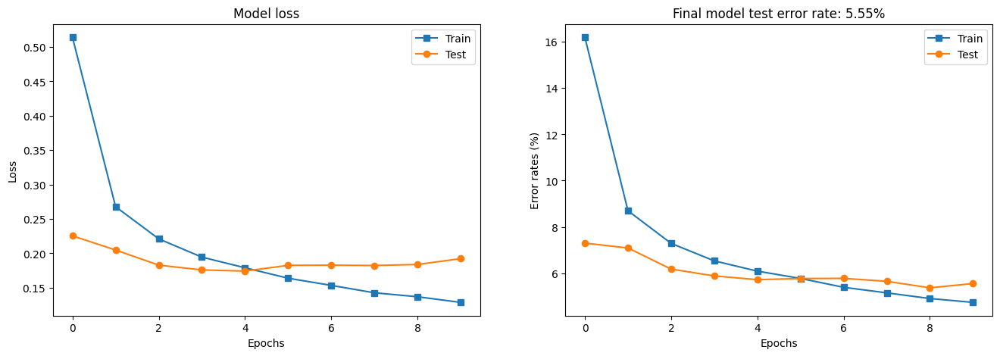

In [98]:
_, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(train_losses, 's-', label='Train')
ax[0].plot(test_losses, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title("Model loss")
ax[0].legend()

ax[1].plot(train_error_rates, 's-', label='Train')
ax[1].plot(test_error_rates, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel("Error rates (%)")
ax[1].set_title(f"Final model test error rate: {test_error_rates[-1]:.2f}%")
ax[1].legend()

plt.show()

## CodeChallenge: Varying number of channels

In [99]:
def get_output_size(input_param, padding_param, kernel_size_param, stride_param):
    return np.floor((input_param + 2 * padding_param - kernel_size_param) / stride_param) + 1

image_size = images.shape[2]

def create_model(conv1_channels_nr_param, conv2_channels_nr_param, print_toggle_param=False):
    class EmnistNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.conv1 = nn.Conv2d(1, conv1_channels_nr_param, 3, 1, 1)
            self.bnorm1 = nn.BatchNorm2d(conv1_channels_nr_param)

            conv1_output_size = get_output_size(image_size, 1, 3, 1)
            conv1_output_size = np.floor(conv1_output_size / 2)

            self.conv2 = nn.Conv2d(conv1_channels_nr_param, conv2_channels_nr_param, 3, 1, 1)
            self.bnorm2 = nn.BatchNorm2d(conv2_channels_nr_param)
            
            conv2_output_size = get_output_size(conv1_output_size, 1, 3, 1)
            conv2_output_size = np.floor(conv2_output_size / 2)
            
            self.fc1 = nn.Linear(int((conv2_output_size ** 2) * conv2_channels_nr_param), 50)
            self.output = nn.Linear(50, 26)
            
        def forward(self, x_param):
            if print_toggle_param: print(f"Input: {x_param.shape}")
            
            x_local = F.max_pool2d(self.conv1(x_param), 2)
            x_local = F.leaky_relu(self.bnorm1(x_local))
            
            if print_toggle_param: print(f"First CPR block: {x_local.shape}")
            
            x_local = F.max_pool2d(self.conv2(x_local), 2)
            x_local = F.leaky_relu(self.bnorm2(x_local))
            
            if print_toggle_param: print(f"Second CPR block: {x_local.shape}")
            
            x_local = torch.flatten(x_local, start_dim=1)
            
            if print_toggle_param: print(f"Vectorized: {x_local.shape}")
            
            x_local = F.leaky_relu(self.fc1(x_local))
            x_local = self.output(x_local)
            
            if print_toggle_param: print(f"Final output: {x_local.shape}")
            
            return x_local
        
    emnist_net_local = EmnistNet().to(device)
    loss_function_local = nn.CrossEntropyLoss()
    optimizer_local = torch.optim.Adam(emnist_net_local.parameters(), lr=.001)
    
    return emnist_net_local, loss_function_local, optimizer_local

In [100]:
def train_model(emnist_net_local, loss_function_local, optimizer_local):
    train_losses_local = []
    test_losses_local = []
    train_error_rates_local = []
    test_error_rates_local = []
     
    for epoch in range(5):
        batch_losses = []
        batch_error_rates = []
         
        emnist_net_local.train()
         
        for X_local, y_local in train_loader:
            y_pred_local = emnist_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
               
            optimizer_local.zero_grad()
            loss_local.backward()
            optimizer_local.step()
            
            batch_losses.append(loss_local.item())
            batch_error_rates.append(torch.mean((torch.argmax(y_pred_local, axis=1) != y_local).float()).item())

        train_losses_local.append(np.mean(batch_losses))
        train_error_rates_local.append(100 * np.mean(batch_error_rates))

        emnist_net_local.eval()
          
        X_local, y_local = next(iter(test_loader))
          
        with torch.no_grad():
            y_pred_local = emnist_net_local(X_local)
            loss_local = loss_function_local(y_pred_local, y_local)
          
        test_losses_local.append(loss_local.item())
        test_error_rates_local.append(100 * torch.mean((torch.argmax(y_pred_local, axis=1) != y_local).float()).item())
     
    return train_error_rates_local, test_error_rates_local, train_losses_local, test_losses_local, emnist_net_local

In [101]:
channels_nr = [2, 5, 8]
channels_nr_len = len(channels_nr)
all_train_error_rates = np.zeros((channels_nr_len, channels_nr_len))
all_test_error_rates = np.zeros((channels_nr_len, channels_nr_len))
all_channels_nr_summed = np.zeros((channels_nr_len, channels_nr_len))

for i, conv1_channels_nr in enumerate(channels_nr):
    for j, conv2_channels_nr in enumerate(channels_nr):        
        emnist_net, loss_function, optimizer = create_model(conv1_channels_nr, conv2_channels_nr)
        train_error_rates, test_error_rates, _, _, _ = train_model(emnist_net, loss_function, optimizer)
        all_train_error_rates[i, j] = train_error_rates[-1]
        all_test_error_rates[i, j] = test_error_rates[-1]
        all_channels_nr_summed[i, j] = conv1_channels_nr + conv2_channels_nr
        
        print(f"Finished conv1 and conv2 channels: {conv1_channels_nr}, {conv2_channels_nr}")

Finished conv1 and conv2 channels: 2, 2
Finished conv1 and conv2 channels: 2, 5
Finished conv1 and conv2 channels: 2, 8
Finished conv1 and conv2 channels: 5, 2
Finished conv1 and conv2 channels: 5, 5
Finished conv1 and conv2 channels: 5, 8
Finished conv1 and conv2 channels: 8, 2
Finished conv1 and conv2 channels: 8, 5
Finished conv1 and conv2 channels: 8, 8


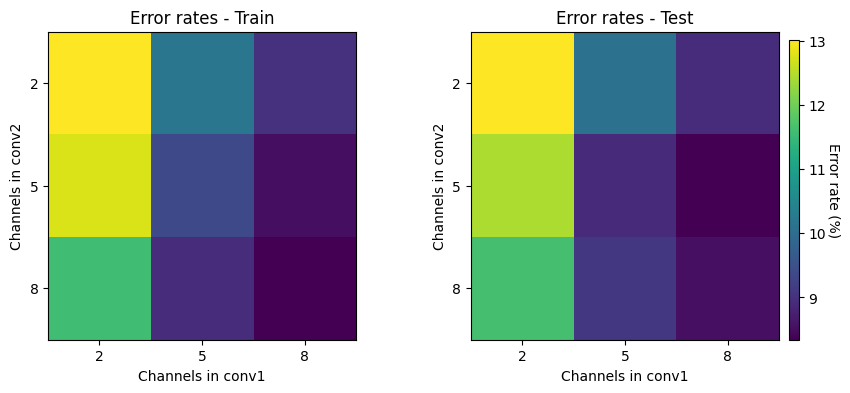

In [102]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

ax[0].imshow(all_train_error_rates)
ax[0].set_xlabel("Channels in conv1")
ax[0].set_ylabel("Channels in conv2")
ax[0].set_xticks(range(channels_nr_len))
ax[0].set_yticks(range(channels_nr_len))
ax[0].set_xticklabels(channels_nr)
ax[0].set_yticklabels(channels_nr)
ax[0].set_title("Error rates - Train")

heatmap = ax[1].imshow(all_test_error_rates)

ax[1].set_xlabel("Channels in conv1")
ax[1].set_ylabel("Channels in conv2")
ax[1].set_xticks(range(channels_nr_len))
ax[1].set_yticks(range(channels_nr_len))
ax[1].set_xticklabels(channels_nr)
ax[1].set_yticklabels(channels_nr)
ax[1].set_title("Error rates - Test")

ax_pos = ax[1].get_position()
cax = fig.add_axes([ax_pos.x1 + .01, ax_pos.y0, .01, .75])
colorbar = fig.colorbar(heatmap, cax=cax)

colorbar.set_label("Error rate (%)", rotation=270, labelpad=10)

plt.show()

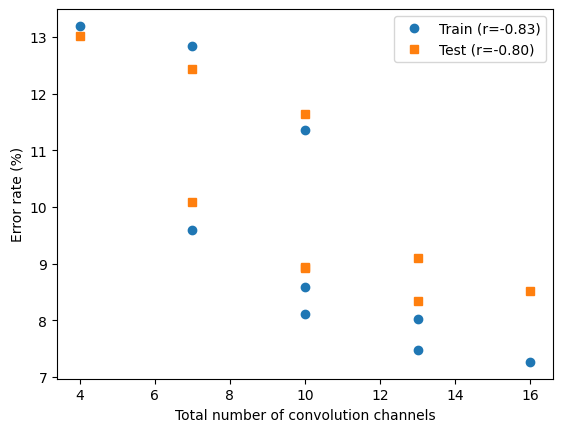

In [103]:
correlation_train = np.corrcoef(all_channels_nr_summed.flatten(), all_train_error_rates.flatten())
correlation_test  = np.corrcoef(all_channels_nr_summed.flatten(), all_test_error_rates.flatten())

plt.plot(all_channels_nr_summed.flatten(), all_train_error_rates.flatten(), 'o', label=f"Train (r={correlation_train[0, 1]:.2f})")
plt.plot(all_channels_nr_summed.flatten(), all_test_error_rates.flatten(), 's', label=f"Test (r={correlation_test[0, 1]:.2f})")
plt.legend()
plt.xlabel("Total number of convolution channels")
plt.ylabel("Error rate (%)")

plt.show()